## Milestone 3 (final milestone)
#### *(last edited: 6:15 PM, 11/20/2023)*

---

The main goal of this milestone is to design a topic based summarization using machine learning methods and present them in an interactive format. We aim to return top related comments related to the subject of interest as determined by the given topic (reference statement). Comments that either praise or criticize the main subject of interest are the deliverables in this process.

**Please follow the instruction to work out this milestone. DO NOT use any ready to use algorithms or libraries for this milestone**

#TODO : Remove this cell once we done and before submission..
adding collab links for easier access for y'all

M1 : https://colab.research.google.com/drive/1MV2pGm0yM9ufKDaYbohKaXo6TPdj9fJk?usp=sharing#scrollTo=GNbaQb1SznCm

M2: https://colab.research.google.com/drive/1YuBuSt0TBkSuq2XHrJOI4tqS66RiZHRJ?authuser=3

#### Essential info
- Which features are the key determining factors in deciding the representative summary statement: ???? (how and why)
- What hyperparameter set works best ???? (how and why)
- What algorithm works best ???? (how and why)
- Bonus part(s): ??? and collaboratively done by which team memeber(s)(if any)
- Additional notes (if any): ???

### Who did what
| What            | Description | By |
| ----------- | -----------       | ----------- |
| Data preparation| Examine the data and peroform data cleansing |  John smith and Mary Joe|
| item#2    | what was done in item#2       | ... |
| more items   | what was done in more items        | ... |
| ...   | ...       | ... |

### Link to your online discussion forum for this project: [discussion link](http://???) (*replace it with your own link*)

## We are working on <font color= red> Politics Dataset! </font>

**What's in the dataset and which one to use:**  
a)   
Team #1 please use
[BBC News Summary/News Article/tech](https://drive.google.com/drive/folders/1wyTM67xGJwYlmxG33sbgQevUrSM4gZJ5?usp=share_link)

Team #2 please use
[BBC News Summary/News Article/sport](https://drive.google.com/drive/folders/1Ad8ZuvmVwccPLpuHGQ35TvlPDowf3knb?usp=share_link)


Team #3 please use
[BBC News Summary/News Article/politics](https://drive.google.com/drive/folders/1mzVdLFmImv86M6tFa03DxrEIelqKIQQU?usp=share_link)


Team #4 please use
[BBC News Summary/News Article/entertainment](https://drive.google.com/drive/folders/1VJumzOPuIASdNDmbjqoylfNzvVXSAOIB?usp=share_link)

Team #5 please use
[BBC News Summary/News Article/business](https://drive.google.com/drive/folders/11zVw9d1ewLamBlgPpolf6FBu5onaoAny?usp=share_link)  


b) Each dataset has around four to five hundred  news articles of BBC from 2004 to 2005. The first clause of the text of articles is the respective title.



c) There may be unwanted words or characters in the datasets.

d) Try to retain the original information provided in the dataset. Try not to change or delete any part of the given dataset unless it is absolutely necessary.

e) You must use this template to add your code and comments when you submit your team project results in the form of another Colab.

f) The summary section can be found udner BBC News Summary/Summaries/xxx, where xxx is your assigned data domain


Please make sure
- Provide <font color= red>clear and explicit explanation</font> on the process and results in your work
- <font color= red>No ad hoc manual methodology</font> should be used in any task below.
- Provide <font color= red>generic solution</font> that is not specific/valid to your data file only
- Comments, in Markdown cells, should be added wherever appropriate
- Always use charts, figures, or other visual formats to present your results
- Copy and rename this file as teamXfinalproject.ipynb in your submission
- Your <font color= red>submitted Colab</font> can be <font color= red>run</font> from the beginning to the end <font color= red>without any error</font> ( you may opt for a different Colab file to showcase your bonus parts).



## Main tasks


---
**Remember to use Markdown cells to describe your work**   
*Do not simply use #s in your code cells for commemnt description*

**Load packages:**

## Get a copy of the data to your own Google drive
Step 1. Use [this chrome app](https://script.google.com/macros/s/AKfycbxbGNGajrxv-HbX2sVY2OTu7yj9VvxlOMOeQblZFuq7rYm7uyo/exec) to copy the[ BBC News Summary](https://drive.google.com/drive/folders/1ZryN8xuRFi0LNYPS1zfZ43RsuW0L6lij?usp=share_link) folder that I shared with you to your own drive.  
Step 2. Put the copied folder in the exact path under your Google drive, i.e., ``` /content/drive/MyDrive/sharedata/BBC News Summary ```, so you collaborate with your team members and get graded subsequently.   

Step 3. <font color =red>0 project score </font> will be given for <font color =red>not following this folder configuration</font> in step 2.
(Our grader is not reponsible to figure out your own perferred Google folder configuration)

In [1]:
import pandas as pd
import numpy as np
import scipy as sp
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB         # Naive Bayes
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

# %matplotlib inline

In [2]:
# import warnings
# warnings.filterwarnings('ignore')

In [3]:
# from google.colab import drive
# drive.mount('/content/drive')

In [4]:
# #1 Mount the Google drive in preparation for data access
# pip install path.py
# import numpy as np
# import pandas as pd
# import os
# # from google.colab import drive
# # drive.mount('/content/drive')

<a id='load_data'></a>

### Load the data

---

Import the assinged data into a pandas DataFrame.
(Extend the code below to access other files under your assigned folder)

In [5]:
from path import Path

corpus = []
filenames = []
#DO NOT CHANGE THIS PATH AS PROF has asked us to use this in the template.
corpus_dir = Path('politics')

for file_path in corpus_dir.files('*.txt'):
    fname = file_path.split("/")
    filenames.append(fname[-1])
    with file_path.open(mode='rt', encoding='utf-8') as fp:
        lines = fp.read().splitlines()
        corpus.append([i for i in lines if i])

### Show what the first txt file looks like

In [6]:
corpus[0]
type(corpus)

list

<a name='how_many_data'></a>
### How many txt files are under your assigned folder?

In [7]:
print('There are {} text files under my assigned folder'.format(len(corpus)))

There are 417 text files under my assigned folder


#TODO : Add comment about below code block

In [8]:
X = []
for y in corpus:
  s = ". ".join(str(x) for x in y)
  X.append(s)



#From the cells below I started writing my answers.. before this was in template!

<a name='tokenize'></a>

### Tokenize all sentences in the give survey dataset with TFIDF.

- Start with default parameters.
- How many rows and columns are there in the resultant vectorized dataframe.


In [9]:
flattened_corpus = [sentence for sublist in corpus for sentence in sublist]

# Initialize TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer()

# Fit the vectorizer to the flattened corpus and transform it
tfidf_matrix = tfidf_vectorizer.fit_transform(flattened_corpus)

# Get the shape of the TF-IDF matrix
rows, columns = tfidf_matrix.shape

print(f"Number of rows (sentences): {rows}")
print(f"Number of columns (unique tokens): {columns}")

Number of rows (sentences): 2684
Number of columns (unique tokens): 11220


<a name='stopwords'></a>

###Show the top words

- Visualize them with a bar chart with frequency in y axis and words in the x-axis
- You may selectively choose top words as the stop words for your processing needs

In [10]:

# Get feature names (words)
feature_names = tfidf_vectorizer.get_feature_names_out()

# Get the average TF-IDF score for each feature (word)
avg_tfidf_scores = tfidf_matrix.mean(axis=0).tolist()[0]

# Create a dictionary to store words and their average TF-IDF scores
word_tfidf_scores = dict(zip(feature_names, avg_tfidf_scores))

# Get the top N words based on TF-IDF scores
top_n = 10  # Change this value to get the desired number of top words
top_words = sorted(word_tfidf_scores.items(), key=lambda item: item[1], reverse=True)[:top_n]

# Print the top words and their TF-IDF scores
print(f"Top {top_n} words based on TF-IDF scores:")
for word, score in top_words:
    print(f"{word}: {score}")


Top 10 words based on TF-IDF scores:
the: 0.11888865416482952
to: 0.0651127834635822
of: 0.051620087693239794
and: 0.046105653633296384
in: 0.042297178299151306
he: 0.03334838305422413
said: 0.03152972017719889
for: 0.029296496835095907
on: 0.029059317252504244
is: 0.028266216394786072


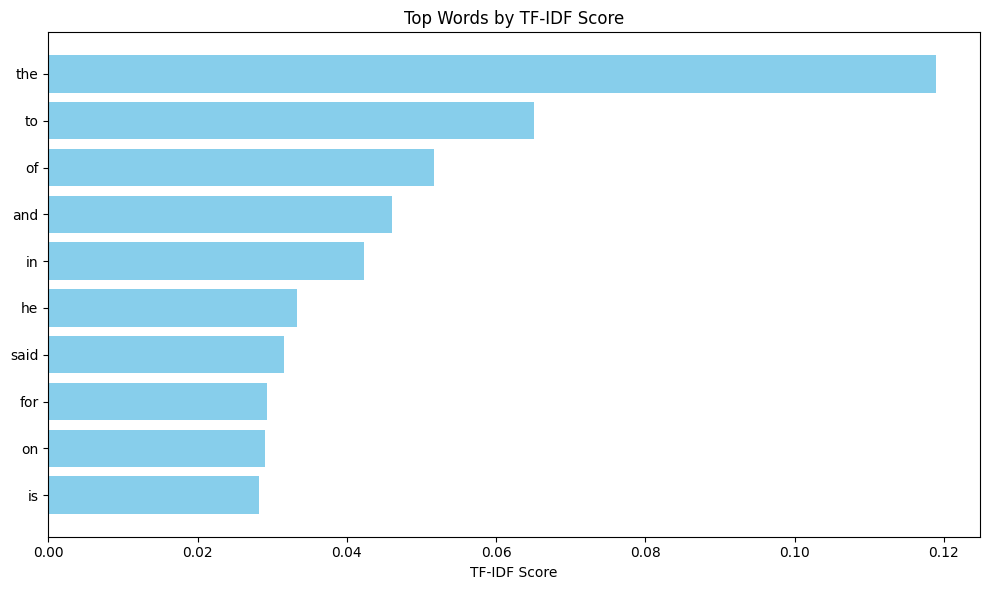

In [11]:
import matplotlib.pyplot as plt

# ... (Previous code remains the same until retrieving top words)

# Extract top words and their TF-IDF scores
top_words, top_scores = zip(*top_words)

# Create a bar chart
plt.figure(figsize=(10, 6))
plt.barh(range(len(top_words)), top_scores, align='center', color='skyblue')
plt.yticks(range(len(top_words)), top_words)
plt.xlabel('TF-IDF Score')
plt.title('Top Words by TF-IDF Score')
plt.gca().invert_yaxis()  # Invert y-axis to display top words at the top
plt.tight_layout()

# Show the bar chart
plt.show()


Remove Stop Words and Check

In [12]:
flattened_corpus = [sentence for sublist in corpus for sentence in sublist]

stop_words_to_remove = ["the", "to", "of", "and", "in", "he", "said", "for", "on", "is"]

# Initialize TfidfVectorizer with stop words
tfidf_vectorizer = TfidfVectorizer(stop_words=stop_words_to_remove)

# Fit the vectorizer to the flattened corpus and transform it
tfidf_matrix = tfidf_vectorizer.fit_transform(flattened_corpus)

# Get feature names (words)
feature_names = tfidf_vectorizer.get_feature_names_out()

# Get the average TF-IDF score for each feature (word)
avg_tfidf_scores = tfidf_matrix.mean(axis=0).tolist()[0]

# Create a dictionary to store words and their average TF-IDF scores
word_tfidf_scores = dict(zip(feature_names, avg_tfidf_scores))

# Get the top N words based on TF-IDF scores
top_n = 10  # Change this value to get the desired number of top words
top_words = sorted(word_tfidf_scores.items(), key=lambda item: item[1], reverse=True)[:top_n]

# Print the top words and their TF-IDF scores
print(f"Top {top_n} words based on TF-IDF scores after removing stop words:")
for word, score in top_words:
    print(f"{word}: {score}")

Top 10 words based on TF-IDF scores after removing stop words:
that: 0.029092955115720374
mr: 0.028183690330269625
be: 0.02798529196508819
was: 0.026068668522545687
it: 0.025216077520073276
has: 0.02307278133904922
will: 0.021068963519428673
labour: 0.02040120271981687
as: 0.020289220070282894
have: 0.020275281530143404


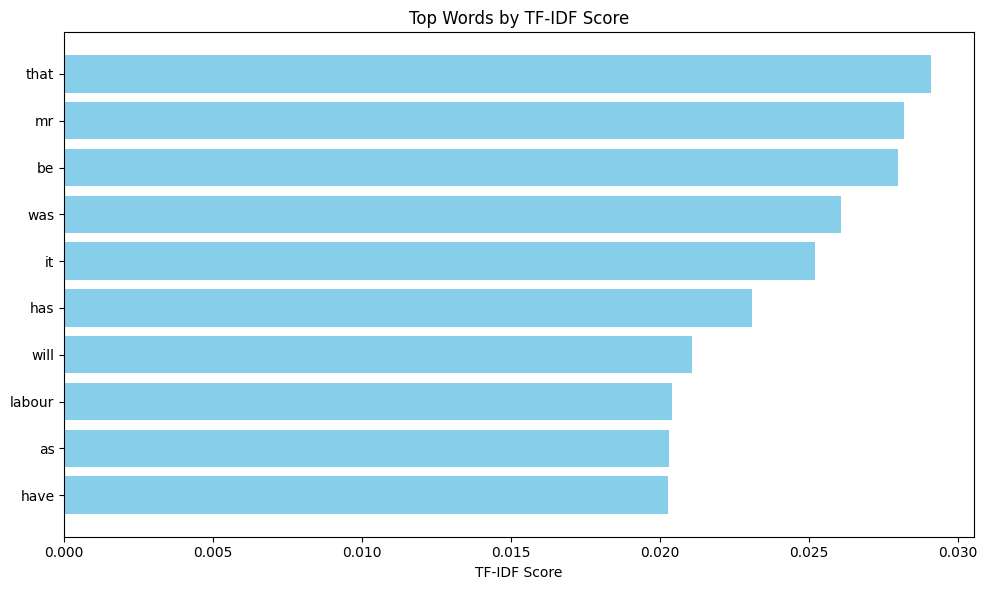

In [13]:
import matplotlib.pyplot as plt

# ... (Previous code remains the same until retrieving top words)

# Extract top words and their TF-IDF scores
top_words, top_scores = zip(*top_words)

# Create a bar chart
plt.figure(figsize=(10, 6))
plt.barh(range(len(top_words)), top_scores, align='center', color='skyblue')
plt.yticks(range(len(top_words)), top_words)
plt.xlabel('TF-IDF Score')
plt.title('Top Words by TF-IDF Score')
plt.gca().invert_yaxis()  # Invert y-axis to display top words at the top
plt.tight_layout()

# Show the bar chart
plt.show()


### After preprocessing the text, it is necessary to extract features and calculate the functions of the sentence, the results of which are vectors of several elements for each sentence. The elements of each vector take values in the interval [0, 1]. We consider the following features

<a name='features'></a>
### Write a function for each of the features below that would return the feature score for any given sentence

<a name='title'></a>

### Title feature (F1)
It is defined as a ratio of the number of matches of the Title words (Tw) in the current sentence (S) to the number of words (w) of the Title (T)   

<img alt="F1" src="https://drive.google.com/uc?export=view&id=1J1GGrkuGcHhPlGRIo7xmPlwHLe0I2LcV">

In [14]:
# Function to calculate the Title feature (F1) for a given sentence.

def title_feature(sentence, title):
    # Tokenize the title and the sentence
    title_words = title.split()
    sentence_words = sentence.split()

    # Count how many title words appear in the sentence
    matches = sum(1 for word in title_words if word in sentence_words)

    # Calculate the feature score
    feature_score = matches / len(title_words)

    # Return the score
    return min(max(feature_score, 0), 1)




In [15]:
# Test
title = corpus[0][0]
print("The title of the article is: %s"%(title))

for currsentence in corpus[0]:
  print("The current sentence of the article is: %s"%(currsentence))
  print(title_feature(currsentence, title))


The title of the article is: Labour plans maternity pay rise
The current sentence of the article is: Labour plans maternity pay rise
1.0
The current sentence of the article is: Maternity pay for new mothers is to rise by £1,400 as part of new proposals announced by the Trade and Industry Secretary Patricia Hewitt.
0.4
The current sentence of the article is: It would mean paid leave would be increased to nine months by 2007, Ms Hewitt told GMTV's Sunday programme. Other plans include letting maternity pay be given to fathers and extending rights to parents of older children. The Tories dismissed the maternity pay plan as "desperate", while the Liberal Democrats said it was misdirected.
0.6
The current sentence of the article is: Ms Hewitt said: "We have already doubled the length of maternity pay, it was 13 weeks when we were elected, we have already taken it up to 26 weeks. "We are going to extend the pay to nine months by 2007 and the aim is to get it right up to the full 12 months by

<a name='sentencelength'></a>

###Sentence Length (F2)
It is defined as a ratio of the number of words (w) in the current sentence (S) to the number of words in the longest sentence (LS) in the text.   

<img alt="F2" src="https://drive.google.com/uc?export=view&id=1b42IWpr5svaCyQl6fdnGNWaLP3Rv4bgK">

In [16]:
# Function to calculate the Sentence Length feature (F2) for a given sentence.

def sentence_length_feature(sentence, longest_sentence):
    # Tokenize the sentences to get the number of words
    num_words_sentence = len(sentence.split())
    num_words_longest_sentence = len(longest_sentence.split())

    # Calculate the feature score
    feature_score = num_words_sentence / num_words_longest_sentence

    return min(max(feature_score, 0), 1)

In [17]:
def calulateLongestSent(sentences):
  count=0
  for sent in sentences:
    if len(sent) > count:
      count = len(sent)
      ls = sent
  return ls

In [18]:
# Test

longest_sentence = calulateLongestSent(corpus[0])

print("The longest sentence of the article is: %s"%(longest_sentence))

for currsentence in corpus[0]:
  print("The current sentence of the article is: %s"%(currsentence))
  print(sentence_length_feature(currsentence, longest_sentence))


The longest sentence of the article is: Ms Hewitt said: "We have already doubled the length of maternity pay, it was 13 weeks when we were elected, we have already taken it up to 26 weeks. "We are going to extend the pay to nine months by 2007 and the aim is to get it right up to the full 12 months by the end of the next Parliament." She said new mothers were already entitled to 12 months leave, but that many women could not take it as only six of those months were paid. "We have made a firm commitment. We will definitely extend the maternity pay, from the six months where it now is to nine months, that's the extra £1,400." She said ministers would consult on other proposals that could see fathers being allowed to take some of their partner's maternity pay or leave period, or extending the rights of flexible working to carers or parents of older children. The Shadow Secretary of State for the Family, Theresa May, said: "These plans were announced by Gordon Brown in his pre-budget revie

<a name='position'></a>

###Sentence position (F3)
It is defined as a maximum of the next two relations   

<img alt="F3" src="https://drive.google.com/uc?export=view&id=1WNqhFyRSkFR7RaGqtZaywOmQVBrUJyb0">


In [19]:
# Function to calculate the Sentence Position feature (F3) for a given sentence position.

def sentence_position_feature(position, total_sentences):
    # Calculate the two relations
    relation1 = 1 / (position + 1)
    relation2 = 1 / (total_sentences - position)

    # Calculate the feature score
    feature_score = max(relation1, relation2)

    return min(max(feature_score, 0), 1)

In [20]:
# Test

total_sentences = len(corpus[0])
print("Total no. of sentences in corpus[0]:", total_sentences)
for pos in range(0,len(corpus[0])):
  print("Sentence position:\n",pos)
  print("The current sentence is : %s \n"%(corpus[0][pos]))
  print("F3(%d) %f"%(pos,sentence_position_feature(pos, total_sentences)))


Total no. of sentences in corpus[0]: 6
Sentence position:
 0
The current sentence is : Labour plans maternity pay rise 

F3(0) 1.000000
Sentence position:
 1
The current sentence is : Maternity pay for new mothers is to rise by £1,400 as part of new proposals announced by the Trade and Industry Secretary Patricia Hewitt. 

F3(1) 0.500000
Sentence position:
 2
The current sentence is : It would mean paid leave would be increased to nine months by 2007, Ms Hewitt told GMTV's Sunday programme. Other plans include letting maternity pay be given to fathers and extending rights to parents of older children. The Tories dismissed the maternity pay plan as "desperate", while the Liberal Democrats said it was misdirected. 

F3(2) 0.333333
Sentence position:
 3
The current sentence is : Ms Hewitt said: "We have already doubled the length of maternity pay, it was 13 weeks when we were elected, we have already taken it up to 26 weeks. "We are going to extend the pay to nine months by 2007 and the a

<a name='termweight'></a>

###Term Weight (F5)
It is defined as a ratio of the sum of the frequencies of term occurrences (TO) in a sentence (S) to the sum of the frequency of term occurrences in the text.   

<img alt="F5" src="https://drive.google.com/uc?export=view&id=1wS8NV1otHFjgu4NePxkyPwQXFpZ4f93q">


In [21]:
# Function to calculate the Term Weight feature (F5) for a given sentence.

def term_weight_feature(sentence, entire_text):
    # Tokenize the sentence and entire text to get words
    sentence_words = sentence.split()
    entire_text_words = entire_text.split()

    # Compute the frequencies in the sentence
    frequency_in_sentence = sum(sentence_words.count(word) for word in set(sentence_words))

    # Compute the frequencies in the entire text
    frequency_in_text = sum(entire_text_words.count(word) for word in set(sentence_words))

    # Calculate the feature score
    feature_score = frequency_in_sentence / frequency_in_text if frequency_in_text != 0 else 0

    # Ensure the score is in the interval [0, 1]
    return min(max(feature_score, 0), 1)


In [22]:
# Test
entire_text = X[0]
print("Entire text is: %s"%(entire_text))

for currsentence in corpus[0]:
  print("Current Sentence: %s"%(currsentence))
  print("F5 =  %f"%(term_weight_feature(currsentence, entire_text)))


Entire text is: Labour plans maternity pay rise. Maternity pay for new mothers is to rise by £1,400 as part of new proposals announced by the Trade and Industry Secretary Patricia Hewitt.. It would mean paid leave would be increased to nine months by 2007, Ms Hewitt told GMTV's Sunday programme. Other plans include letting maternity pay be given to fathers and extending rights to parents of older children. The Tories dismissed the maternity pay plan as "desperate", while the Liberal Democrats said it was misdirected.. Ms Hewitt said: "We have already doubled the length of maternity pay, it was 13 weeks when we were elected, we have already taken it up to 26 weeks. "We are going to extend the pay to nine months by 2007 and the aim is to get it right up to the full 12 months by the end of the next Parliament." She said new mothers were already entitled to 12 months leave, but that many women could not take it as only six of those months were paid. "We have made a firm commitment. We will

<a name='propernoun'></a>

###Proper Noun (F6):     
It is defined as a ratio of the number of proper nouns (PN) in a sentence (S) to the length (L) of a sentence

<img alt="F6" src="https://drive.google.com/uc?export=view&id=1MEBknA87K-vPSlu061F-hOz_c9aHrl6W">

In [23]:
import nltk
from nltk.tokenize import word_tokenize
from nltk import pos_tag

nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

# Function to calculate the Proper Noun feature (F6) for a given sentence.

def proper_noun_feature(sentence):
    # Tokenize the sentence
    words = word_tokenize(sentence)

    # Get the part-of-speech tags
    tagged_words = pos_tag(words)

    # Count the number of proper nouns
    num_proper_nouns = sum(1 for word, tag in tagged_words if tag == 'NNP' or tag == 'NNPS')

    # Calculate the feature score
    feature_score = num_proper_nouns / len(words) if len(words) != 0 else 0

    return min(max(feature_score, 0), 1)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\PC\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\PC\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [24]:
# Test
for currsentence in corpus[0]:
  print("Current Sentence: %s"%(currsentence))
  print("F6 =  %f"%(proper_noun_feature(currsentence)))

Current Sentence: Labour plans maternity pay rise
F6 =  0.200000
Current Sentence: Maternity pay for new mothers is to rise by £1,400 as part of new proposals announced by the Trade and Industry Secretary Patricia Hewitt.
F6 =  0.240000
Current Sentence: It would mean paid leave would be increased to nine months by 2007, Ms Hewitt told GMTV's Sunday programme. Other plans include letting maternity pay be given to fathers and extending rights to parents of older children. The Tories dismissed the maternity pay plan as "desperate", while the Liberal Democrats said it was misdirected.
F6 =  0.112903
Current Sentence: Ms Hewitt said: "We have already doubled the length of maternity pay, it was 13 weeks when we were elected, we have already taken it up to 26 weeks. "We are going to extend the pay to nine months by 2007 and the aim is to get it right up to the full 12 months by the end of the next Parliament." She said new mothers were already entitled to 12 months leave, but that many women

<a name='numerical'></a>

###Numerical Data (F7)
 It is defined as a ratio of the number of numerical data (ND) in the sentence (S) to the length (L) of the sentence   

 <img alt="F7" src="https://drive.google.com/uc?export=view&id=1tCaSaipvqs3CvpvISyCR5ytNzDCuwJV5">


In [25]:
from nltk.tokenize import word_tokenize

# Helper function to check if a word represents a float
def is_float(token):
    try:
        float(token)
        return True
    except ValueError:
        return False

# Function to calculate the Numerical Data feature (F7) for a given sentence.
def numerical_data_feature(sentence):

    # Tokenize the sentence
    words = word_tokenize(sentence)

    # Count the number of numerical data tokens
    num_numerical_data = sum(1 for word in words if word.isdigit() or is_float(word))

    # Calculate the feature score
    feature_score = num_numerical_data / len(words) if len(words) != 0 else 0

    return min(max(feature_score, 0), 1)

In [26]:
# Test

for currsentence in corpus[2]:
  print("Current Sentence: %s"%(currsentence))
  print("F7 =  %f"%(numerical_data_feature(currsentence)))

Current Sentence: Hewitt decries 'career sexism'
F7 =  0.000000
Current Sentence: Plans to extend paid maternity leave beyond six months should be prominent in Labour's election manifesto, the Trade and Industry Secretary has said.
F7 =  0.000000
Current Sentence: Patricia Hewitt said the cost of the proposals was being evaluated, but it was an "increasingly high priority" and a "shared goal across government". Ms Hewitt was speaking at a gender and productivity seminar organised by the Equal Opportunities Commission (EOC). Mothers can currently take up to six months' paid leave - and six unpaid. Ms Hewitt told the seminar: "Clearly, one of the things we need to do in the future is to extend the period of payment for maternity leave beyond the first six months into the second six months. "We are looking at how quickly we can do that, because obviously there are cost implications because the taxpayer reimburses the employers for the cost of that."
F7 =  0.000000
Current Sentence: Ms Hew

<a name='combine'></a>

###Combining feature vectors to decide which are representative statements
Propose a formula that combines the F scores for any given sentence.   

Explain why your formula would allow you to identify the most important sentences as a possible summary of the original article.   

Justify your formula with reasons.


In [27]:
# Function to compute the combined score for a sentence based on multiple features.
def compute_sentence_score(sentence, entire_text, title, weights, longest_sentence, position, total_sentences):

    # Compute individual feature scores
    F1 = title_feature(sentence, title)
    F2 = sentence_length_feature(sentence, longest_sentence)
    F3 = sentence_position_feature(position, total_sentences)
    F5 = term_weight_feature(sentence, entire_text)
    F6 = proper_noun_feature(sentence)
    F7 = numerical_data_feature(sentence)

    # Combine the feature scores using the weights
    score = (weights['F1'] * F1 +
             weights['F2'] * F2 +
             weights['F3'] * F3 +
             weights['F5'] * F5 +
             weights['F6'] * F6 +
             weights['F7'] * F7)

    return score

In [28]:

# Sample usage
def summarize(n, entire_text, title, doc):
  # Define feature weights
  weights = {
      'F1': 0.2,  # Title feature
      'F2': 0.1,  # Sentence length
      'F3': 0.3,  # Sentence position
      'F5': 0.2,  # Term weight
      'F6': 0.1,  # Proper noun
      'F7': 0.1   # Numerical data
  }

  longest_sentence = calulateLongestSent(doc)
  total_sentences = len(doc)

  print("Entire text: %s"%(entire_text))
  highest_f_score = 0
  target_pos = 0

  for pos in range(1,len(doc)):
    sentence = doc[pos]
    f_score = compute_sentence_score(sentence=sentence, entire_text=entire_text, title=title, weights=weights, longest_sentence=longest_sentence, position=pos, total_sentences=total_sentences )

    if highest_f_score < f_score:
      highest_f_score = f_score
      target_pos = pos

  print("*******Most important sentence:\n%s"%(doc[target_pos]))
  print("F_SCORE of above sentence: %f"%(highest_f_score))
  return highest_f_score



In [29]:
summarize(0, entire_text=X[1], title = corpus[1][0], doc = corpus[1])

Entire text: Watchdog probes e-mail deletions. The information commissioner says he is urgently asking for details of Cabinet Office orders telling staff to delete e-mails more than three months old.. Richard Thomas "totally condemned" the deletion of e-mails to prevent their disclosure under freedom of information laws coming into force on 1 January. Government guidance said e-mails should only be deleted if they served "no current purpose", Mr Thomas said. The Tories and the Lib Dems have questioned the timing of the new rules.. Tory leader Michael Howard has written to Tony Blair demanding an explanation of the new rules on e-mail retention. On Monday Lib Dem constitutional affairs committee chairman Alan Beith warned that the deletion of millions of government e-mails could harm the ability of key probes like the Hutton Inquiry. The timing of the new rules just before the Freedom of Information Act comes into forces was "too unlikely to have been a coincidence", Mr Beith said. But 

0.515217223512596

To combine the features(F score) for any given sentence we used the following formuala

_**Score(S) = w<sub>1</sub> x F1 + w<sub>2</sub> x F2 + w<sub>3</sub> x F3 + w<sub>5</sub> x F5 + w<sub>6</sub> x F6 + w<sub>7</sub> x F7**_

where:
- Score(S) : total score of the sentence S
- w<sub>i</sub> : weights for each features

We selected the values for each weight based on their importance.

- **Title Feature (F1) -**  _**0.2:**_ Given that the title of an article usually encapsulates the main theme or subject, matching words from the title in a sentence can indicate relevance. A moderate weight was assigned to account for this significance.
- **Sentence Length (F2) - _0.1_:** While sentence length can indicate informativeness, it's not always a strong indicator of relevance. Therefore, a lower weight was chosen.
- **Sentence Position (F3) - _0.3_:** Articles often start with an introduction to the main topic and end with a conclusion or summary, making the position of a sentence potentially significant. A higher weight was given to this feature based on the assumption that introductory and concluding sentences might be particularly informative.
- **Term Weight (F5) - _0.2_:** Frequently occurring terms in an article often denote the primary subject or subjects of discussion. Thus, sentences containing these terms can be deemed more relevant, justifying a moderate weight.
- **Proper Noun (F6) - _0.1_:** While sentences with proper nouns can signify important events, entities, or ideas, not all articles or texts may be centered around proper nouns. Thus, a smaller weight was allocated.
- **Numerical Data (F7) - _0.1_:** Sentences with numerical data might be considered data-rich, providing specific details or facts. However, like proper nouns, not all articles will have significant numerical data, so a lower weight was chosen.


<a name='validation'></a>

###Validation
With your formula, show a one sentence summary of each of the given article in your assigned data folder.    

Provide an interactive code below for users to enter a random number, say 42, and view the original article (042.txt) and the deduced matching one sentence summary


In [30]:
n =1
summarize(n-1, entire_text=X[n-1], title = corpus[n-1][0], doc = corpus[n-1])

Entire text: Labour plans maternity pay rise. Maternity pay for new mothers is to rise by £1,400 as part of new proposals announced by the Trade and Industry Secretary Patricia Hewitt.. It would mean paid leave would be increased to nine months by 2007, Ms Hewitt told GMTV's Sunday programme. Other plans include letting maternity pay be given to fathers and extending rights to parents of older children. The Tories dismissed the maternity pay plan as "desperate", while the Liberal Democrats said it was misdirected.. Ms Hewitt said: "We have already doubled the length of maternity pay, it was 13 weeks when we were elected, we have already taken it up to 26 weeks. "We are going to extend the pay to nine months by 2007 and the aim is to get it right up to the full 12 months by the end of the next Parliament." She said new mothers were already entitled to 12 months leave, but that many women could not take it as only six of those months were paid. "We have made a firm commitment. We will de

0.5025889890840057

<a name='experiment'></a>
###11. Experiment with removing stopwords, lemmatization, and stemming options in vectorizing the given dataset.
- Repeat steps above with one of the three options and see which would be able to return a more representative summary sentence for any given articles in your assigned domain
- Consider using your customized stopwords list to enhance results.
- What combination of these three options give you the best result.
- Explain the why the combination option would yields a representative sentence.


In [31]:
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.tokenize import word_tokenize

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

stop_words = set(stopwords.words('english'))

lemmatizer = WordNetLemmatizer()
stemmer = PorterStemmer()

def preprocess_text(text, remove_stopwords=True, lemmatize=False, stem=False):
    tokens = word_tokenize(text)
    if remove_stopwords:
        tokens = [word for word in tokens if word.lower() not in stop_words]
    if lemmatize:
        tokens = [lemmatizer.lemmatize(word) for word in tokens]
    if stem:
        tokens = [stemmer.stem(word) for word in tokens]
    return " ".join(tokens)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\PC\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\PC\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\PC\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [32]:
from sklearn.feature_extraction.text import TfidfVectorizer

def summarize_article(n):
# Define various combinations of preprocessing
  combinations = {
      "Stopwords Removal": {"remove_stopwords": True, "lemmatize": False, "stem": False},
      "Lemmatization": {"remove_stopwords": False, "lemmatize": True, "stem": False},
      "Stemming": {"remove_stopwords": False, "lemmatize": False, "stem": True},
      "Stopwords + Lemmatization": {"remove_stopwords": True, "lemmatize": True, "stem": False},
      "Stopwords + Stemming": {"remove_stopwords": True, "lemmatize": False, "stem": True},
      "Lemmatization + Stemming": {"remove_stopwords": False, "lemmatize": True, "stem": True},
      "All": {"remove_stopwords": True, "lemmatize": True, "stem": True}
  }

  # Vectorize for each combination and store the result
  tfidf_results = {}
  highest_article_f_score = 0
  for name, ops in combinations.items():
    # print("Evaluating combination: %s"%(name))
    preprocessed_entire_text = preprocess_text(X[n], **ops)
    preprocessed_title = preprocess_text(corpus[n][0], **ops)
    preprocessed_doc = [preprocess_text(sentence, **ops) for sentence in corpus[n]]
    article_f_score = summarize(n, entire_text=preprocessed_entire_text, title=preprocessed_title, doc=preprocessed_doc)

    if (article_f_score > highest_article_f_score):
      highest_article_f_score = article_f_score
      result_combination = name

  # print("Combination with highest F score is: %s with value %f"%(result_combination, highest_article_f_score))


In [33]:
summarize_article(2)

Entire text: Hewitt decries 'career sexism ' . Plans extend paid maternity leave beyond six months prominent Labour 's election manifesto , Trade Industry Secretary said .. Patricia Hewitt said cost proposals evaluated , `` increasingly high priority '' `` shared goal across government '' . Ms Hewitt speaking gender productivity seminar organised Equal Opportunities Commission ( EOC ) . Mothers currently take six months ' paid leave - six unpaid . Ms Hewitt told seminar : `` Clearly , one things need future extend period payment maternity leave beyond first six months second six months . `` looking quickly , obviously cost implications taxpayer reimburses employers cost that. '' . Ms Hewitt also announced new drive help women want work male dominated sectors , saying sexism work still preventing women reaching full potential . Plans include funding universities help female science engineering graduates find jobs `` taster courses '' men women non-traditional jobs . Women full-time work

In [34]:
def summarize_article2(n):
# Define various combinations of preprocessing
  combinations = {
      "Stopwords Removal": {"remove_stopwords": True, "lemmatize": False, "stem": False},
      "Lemmatization": {"remove_stopwords": False, "lemmatize": True, "stem": False},
      "Stemming": {"remove_stopwords": False, "lemmatize": False, "stem": True},
      "Stopwords + Lemmatization": {"remove_stopwords": True, "lemmatize": True, "stem": False},
      "Stopwords + Stemming": {"remove_stopwords": True, "lemmatize": False, "stem": True},
      "Lemmatization + Stemming": {"remove_stopwords": False, "lemmatize": True, "stem": True},
      "All": {"remove_stopwords": True, "lemmatize": True, "stem": True}
  }

  # Vectorize for each combination and store the result
  tfidf_results = {}
  highest_article_f_score = 0
  for name, ops in combinations.items():
    print("Evaluating combination: %s"%(name))
    preprocessed_entire_text = preprocess_text(X[n], **ops)
    preprocessed_title = preprocess_text(corpus[n][0], **ops)
    preprocessed_doc = [preprocess_text(sentence, **ops) for sentence in corpus[n]]
    article_f_score = summarize(n, entire_text=preprocessed_entire_text, title=preprocessed_title, doc=preprocessed_doc)

    if (article_f_score > highest_article_f_score):
      highest_article_f_score = article_f_score
      result_combination = name

  return result_combination, highest_article_f_score

def summarize_all():
  bestComboList = []
  highestFScoreList = []
  for i in range(1,len(corpus)):
    bestCombo, highestFScore = summarize_article2(i)
    bestComboList.append(bestCombo)
    highestFScoreList.append(highestFScore)

  return bestComboList,highestFScoreList

bestCombos,highestFScores = summarize_all()

print(bestCombos)
print(highestFScores)

Evaluating combination: Stopwords Removal
Entire text: Watchdog probes e-mail deletions . information commissioner says urgently asking details Cabinet Office orders telling staff delete e-mails three months old .. Richard Thomas `` totally condemned '' deletion e-mails prevent disclosure freedom information laws coming force 1 January . Government guidance said e-mails deleted served `` current purpose '' , Mr Thomas said . Tories Lib Dems questioned timing new rules .. Tory leader Michael Howard written Tony Blair demanding explanation new rules e-mail retention . Monday Lib Dem constitutional affairs committee chairman Alan Beith warned deletion millions government e-mails could harm ability key probes like Hutton Inquiry . timing new rules Freedom Information Act comes forces `` unlikely coincidence '' , Mr Beith said . Cabinet Office spokeswoman said move new laws `` destruction important records '' . Mr Beith urged information commissioner look `` e-mail regime '' could `` suppor

*******Most important sentence:
Liberal Democrat Sarah Teather , the most recent female MP to be elected , told researcher : `` Lots of people say it 's like an old boy club . `` I 've always said to me it feel more like a teenage public school - you know a public school full of teenager . '' Prof Joni Lovenduski , who conducted the study with the help of Margaret Moran MP and a team of journalist , said she wa shocked at the finding . `` We expected a bit of this but nothing like this extent . We expected to find a couple of shocking episode . '' But she said there wa a difference between the experience of woman before the 1997 intake and afterwards . This wa mainly because there were more woman present in Parliament who were not prepared to `` put up with '' the sexist attitude they came across , Prof Lovenduski said . But she added : `` Some woman , including the woman who came in 1997 , received extraordinary treatment and I am not convinced that if the number of woman changed back

In [35]:
resFSCoreDf = pd.DataFrame(list(zip(bestCombos,highestFScores)), columns = ["Best Combination", "Highest F Score"])

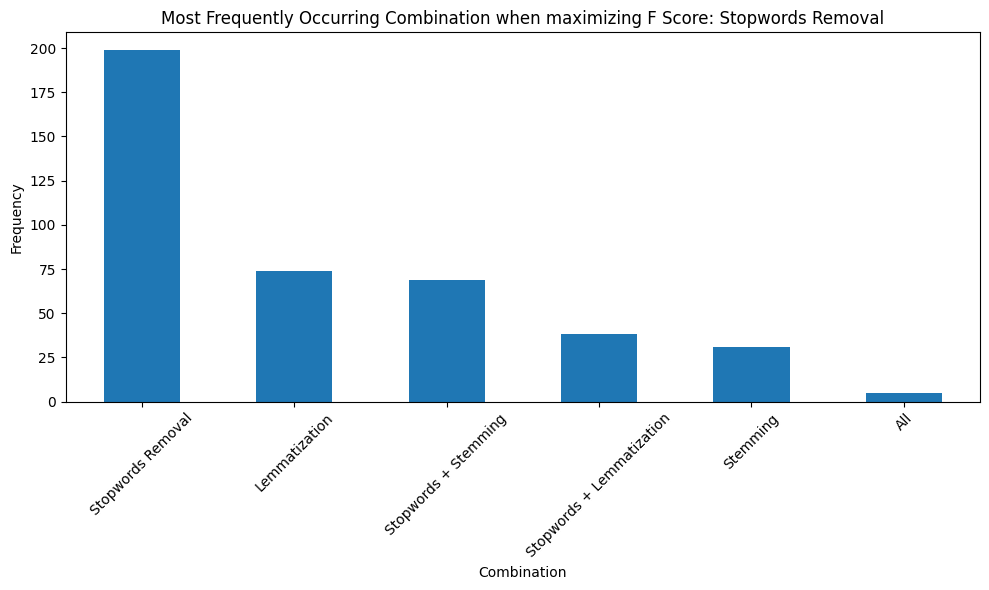

In [36]:
# Count the occurrences of each combination
combination_counts = resFSCoreDf['Best Combination'].value_counts()

# Get the most frequently occurring combination
most_common_combination = combination_counts.idxmax()

# Create a bar chart to visualize the combination frequencies
plt.figure(figsize=(10, 6))
combination_counts.plot(kind='bar')
plt.xlabel('Combination')
plt.ylabel('Frequency')
plt.title('Most Frequently Occurring Combination when maximizing F Score: {}'.format(most_common_combination))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

We removed stopwords, did lemmatization and stemming. Before looking into what the results are let's see what these actual mean.

#### **Stopwords Removal**
Helps reduce the dimensionality and remove noise, emphasizing meaningful terms.

#### **Lemmatization**
Groups different inflections of words, potentially enhancing term frequency metrics.

#### **Stemming**
Simplifies words to their root form but might be too aggressive, leading to loss of meaning.

We tried all the possible combination possible among these three and found that removing stopwords is beneficial as articles often contain many common words. Also, we should prefer lemmatization over stemming to preserve word meaning. This is verified with the F score as the highest F score is for the combination **stopwords**. The main reason is that this combination reduces noise while ensuring that different word forms are treated uniformly.

#TODO :Stopped here to take a call on what to carry over from M1 as there is a lot of bluescore stuff we did which I'm not sure if we should carry over or what parts of it should we carry over

# Word2Vec
###  Provide all relevant codes for the following:

#Data Preprocessing

##1)

In [37]:
from nltk.tokenize import sent_tokenize
from gensim.models import Word2Vec

#Have a look at the element of corpus
corpus[1]

['Watchdog probes e-mail deletions',
 'The information commissioner says he is urgently asking for details of Cabinet Office orders telling staff to delete e-mails more than three months old.',
 'Richard Thomas "totally condemned" the deletion of e-mails to prevent their disclosure under freedom of information laws coming into force on 1 January. Government guidance said e-mails should only be deleted if they served "no current purpose", Mr Thomas said. The Tories and the Lib Dems have questioned the timing of the new rules.',
 'Tory leader Michael Howard has written to Tony Blair demanding an explanation of the new rules on e-mail retention. On Monday Lib Dem constitutional affairs committee chairman Alan Beith warned that the deletion of millions of government e-mails could harm the ability of key probes like the Hutton Inquiry. The timing of the new rules just before the Freedom of Information Act comes into forces was "too unlikely to have been a coincidence", Mr Beith said. But a 

## 2)

In [38]:
#Length of corpus
len(corpus)

417

##3)

In [39]:
import string
def remove_punctuation(document):
  sent=[]
  for sen in document:
    sentence = sen.translate(str.maketrans('','', string.punctuation))
    sent.append(sentence)
  document = '. '.join(sent)
  document = sent_tokenize(str(document))
  return document

## 4) More here if needed

In [40]:
def strip_text(files):
  new_documents =[]
  for doc in files:
    document = remove_punctuation(doc)
    new_documents.append(document)
  return new_documents

In [41]:
documents = strip_text(corpus)

##Break into sentences

In [42]:
sentences = []
keys = []
for i in range(len(documents)):
  sentences += documents[i][1:] # Not considering title
  keys += documents[i][0].split()
print(len(sentences),len(documents))

2265 417


In [43]:
print(sentences[500])
print(keys[500])

Welsh councils should set their taxes at reasonable levels after being given an average funding increase of 6 says the assembly government.
reasonable.


In [44]:
lowercase_sentences = [sentence.lower() for sentence in sentences]

In [45]:
len(lowercase_sentences)

2265

In [46]:
lowercase_sentences[2260]

'unveiling the slogan at the partys spring conference he said there was no glass ceiling to its ambitions he told delegates that labour had abused the publics trust and that the tories had failed to oppose them in response the conservatives insisted that theirs was the party that understood the forgotten majority.'

##Tokenize sentences

In [47]:
!pip install word2number
from sklearn.feature_extraction.text import CountVectorizer
from nltk.stem import WordNetLemmatizer
from nltk.stem.snowball import SnowballStemmer
count = CountVectorizer(stop_words='english')
import pandas as pd
df = pd.DataFrame(sentences)

bag_of_words = count.fit_transform(df.squeeze())# transform df to a series
counts = pd.DataFrame(bag_of_words.toarray(),
                  columns=count.get_feature_names_out())
counts

'pip' is not recognized as an internal or external command,
operable program or batch file.


,0001,050505,0530gmt,053bn,07,0800,10,100,1000,10000,...,yvette,zambia,zambian,zeal,zealand,zero,zeroemissions,zhaoxing,zimbabwe,zone
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2261,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2262,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2263,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [48]:
type(counts)

pandas.core.frame.DataFrame

In [49]:
len(count.get_feature_names_out())

11687

In [50]:
sentences[600]

'The Lord Chief Justice Lord Woolf who is the most senior judge in England and Wales said it was Lord Scarmans pioneering work which paved the way for the Human Rights Act 1998 He was a lawyer and a judge who had a remarkable insight into human nature and an exceptional sensitivity to the needs of a healthy society he said He was personally totally charming and he will be remembered with great affection and admiration by all who came into contact with him.'

#Step 1. Build a Word2vec model and adjust your hyperparameters for the best results

#TODO The params we pass to the model are not what we said we will pick initially e.g. we said will start with vector size 100 but we picked 64 oin the mdoel below..is that after paramter tuning or?

In [51]:
model = Word2Vec(workers=4,vector_size=64,min_count=1,window=7,sg=1,sample=1e-3,negative=10,alpha=0.025,min_alpha=0.0008333)

# Explain how you come to the hyperparameter choice?

---



### Show your code and reasons on how choose the optimal value for each of the  hyperparameters

## **1.min_count**


We want to initially not ignore any words, so we will keep the min_count at 1.

In [52]:
min_count = 1

## **2.window**


We want to initially keep a larger window to look at words that may be further apart in a sentence, instead of having a myopic view.

In [53]:
window = 7

## **3.Size**

This is just an initial guess; Too much and the embeddings become too sparse, too less and the embeddings all seem close together.

In [54]:
vector_size = 100

## **4. Sample**

Useful for downsampling highly reoccuring words. Initially set to 0 since there aren't that many words that occur frequently (discounting stopwords)

In [55]:
sampling_factor = 0

## **5. alpha**

Initial guess; We can tweak this accordingly depending on the results we see.

In [56]:
init_alpha = 0.01

## **6. min_alpha**

Initial guess; We can tweak this accordingly depending on the results we see.

In [57]:
min_alpha = 0.001

## **7.Negative**

We will initially not use negative sampling to have a better idea of baseline model performance - we will only use it later in case we see an over-fixation on certain words.

In [58]:
negative_sampling = 0

## **8. sg: Skip Gram**

We will use skip gram since it is better on smaller datasets and representing lower frequency words, as compared to Continuous Bag of Words (CBOW)

In [59]:
skipgram = 1

## **9. workers**

We can stick to around 4 workers, and increase them further if the colab environment benefits from that.

In [60]:
num_workers = 4

### Step 2: Building the Vocabulary

### Step 2.1:
### Prepare <font color =red>ALL articles</font> under your assinged topic folder, e.g. sport, ready for Vocabulary building and subsequent training
### **Do not include** the **titles** of all articles in this stage
#### Make sure each sentence is in an array by itself   
#### For example, [Sometimes, the, system, cuts, us, from, registering, to, course, without, any, prior, notice., The, accounting, service, was, never, accurate.]  
#### Should be like this instead:
#### [Sometimes, the, system, cuts, us, from, registering, to, course, without, any, prior, notice.]   
#### [The, accounting, service, was, never, accurate.]


## Convert each article/paragraph into a list of sentences using Sentence Tokenizer

In [61]:
len(corpus)
corpus[0]

from nltk.tokenize import sent_tokenize

articles_sent_tokenized = []
titles = []
for x in corpus:
  titles.append(x[:1])
  sentences = " ".join(x[1:])
  arr = sent_tokenize(sentences)
  articles_sent_tokenized.append(arr)

In [62]:
articles_sent_tokenized[0]

['Maternity pay for new mothers is to rise by £1,400 as part of new proposals announced by the Trade and Industry Secretary Patricia Hewitt.',
 "It would mean paid leave would be increased to nine months by 2007, Ms Hewitt told GMTV's Sunday programme.",
 'Other plans include letting maternity pay be given to fathers and extending rights to parents of older children.',
 'The Tories dismissed the maternity pay plan as "desperate", while the Liberal Democrats said it was misdirected.',
 'Ms Hewitt said: "We have already doubled the length of maternity pay, it was 13 weeks when we were elected, we have already taken it up to 26 weeks.',
 '"We are going to extend the pay to nine months by 2007 and the aim is to get it right up to the full 12 months by the end of the next Parliament."',
 'She said new mothers were already entitled to 12 months leave, but that many women could not take it as only six of those months were paid.',
 '"We have made a firm commitment.',
 'We will definitely exten

## For each of the sentences in the list, breaking it into words such that <br> *Each one sentence is represented here as an array with indivisual words as it's elements **

In [63]:
titles[0]

['Labour plans maternity pay rise']

In [64]:
sentences = []
for i in range(len(articles_sent_tokenized)):
  for x in articles_sent_tokenized[i]:
    sentences.append(x.split())

In [65]:
sentences[0]

['Maternity',
 'pay',
 'for',
 'new',
 'mothers',
 'is',
 'to',
 'rise',
 'by',
 '£1,400',
 'as',
 'part',
 'of',
 'new',
 'proposals',
 'announced',
 'by',
 'the',
 'Trade',
 'and',
 'Industry',
 'Secretary',
 'Patricia',
 'Hewitt.']

In [66]:
len(sentences)

8719

### Step 2.2:
### Build your vocabulary
#### What is the resultant corpus_count and corpus_total_words?
#### How do these two numbers relate to the files under your given topic?
#### Verify and explain this technically.


In [67]:
model.build_vocab(sentences, progress_per=10000)

In [68]:
model.corpus_count

8719

In [69]:
model.corpus_total_words

187187

### Step 3: Training of the model:


### Step 3.1: Training your model with the articles (excluding title sentences) assigned to your topic

In [70]:
model.train(sentences, total_examples=model.corpus_count, epochs=30, report_delay=1)

(4448310, 5615610)

### Step 3.2: save the trained model

In [71]:
model.save("all_except_title.model")

### Step 3.3 Select the title of a random article under your assigned folder and prepare it to be ***embedded*** into your trained model, i.e., all_except_title.model.


In [72]:
# Take the title of a random article as an example:
reference = "Roddick to face Saulnier in final"
reference_splitted = reference.lower().split()

### Step 4. Summarization based on a given reference statement (an article title)

### Step 4.1 Reload the model THEN add the selected reference sentence(article title) to be embedded in the previously trained model. Repeat this for each article programmatically.

In [73]:
model_336 = Word2Vec.load("all_except_title.model")
model_336.train([reference_splitted], total_examples=1, epochs=1)

(3, 6)

In [74]:
titles[0][0]

'Labour plans maternity pay rise'



```
# This is formatted as code
```

### Step 4.2 Deduce the top 3 sentences that are most related to the given reference sentence, i.e., the article title.

In [75]:
sentences_score = []
for s1 in articles_sent_tokenized[0]:
    distance = model_336.wv.n_similarity(s1.lower().split(), reference.lower().split())
    sentences_score.append((distance, s1))

top_sentences = sorted(sentences_score)

In [76]:
top_sentences[-3:]

[(0.77768886,
  'She said her party would boost maternity pay in the first six months to allow more women to stay at home in that time.'),
 (0.78839475,
  '"We are going to extend the pay to nine months by 2007 and the aim is to get it right up to the full 12 months by the end of the next Parliament."'),
 (0.795326,
  'The Shadow Secretary of State for the Family, Theresa May, said: "These plans were announced by Gordon Brown in his pre-budget review in December and Tony Blair is now recycling it in his desperate bid to win back women voters."')]

### Step 4.3 How many of the top 3 sentences returned is/are included in the affiliated summary?
#### Why?

Fine tune your model hyperparameters </font>and repeat steps 1-4.3 to get a better result.

#TODO check this path of sumamry articles below..does it need to be changed? Should it be "'/content/drive/MyDrive/sharedata/BBC News Summary/Summaries' instead as per out last milestone collab?

In [97]:
summary_dir = Path('Summaries/Summaries/politics')
reference_summaries = {}

for x in summary_dir.files('*.txt'):
  file_name = x.split("/")
  filenames.append(file_name[-1])
  with x.open(mode='rt', encoding='utf-8') as fp:
        text = fp.read()
        reference_summaries[file_name[-1]] = text

In [98]:
# for x in summary_dir.files('*.txt'):
#   file_name = x.split("/")
#   print(file_name)
#   with x.open(mode='rt', encoding='utf-8') as fp:
#         text = fp.read()
#         print(text)

reference_summaries


{'politics\\001.txt': 'She said her party would boost maternity pay in the first six months to allow more women to stay at home in that time.She said new mothers were already entitled to 12 months leave, but that many women could not take it as only six of those months were paid.The Tories dismissed the maternity pay plan as "desperate", while the Liberal Democrats said it was misdirected.She said ministers would consult on other proposals that could see fathers being allowed to take some of their partner\'s maternity pay or leave period, or extending the rights of flexible working to carers or parents of older children.Liberal Democrat spokeswoman for women Sandra Gidley said: "While mothers would welcome any extra maternity pay the Liberal Democrats feel this money is being misdirected."We will definitely extend the maternity pay, from the six months where it now is to nine months, that\'s the extra £1,400."Ms Hewitt said: "We have already doubled the length of maternity pay, it was 

In [91]:
top_sentences

[(0.64755213,
  "It would mean paid leave would be increased to nine months by 2007, Ms Hewitt told GMTV's Sunday programme."),
 (0.65422666,
  'Ms Hewitt also stressed the plans would be paid for by taxpayers, not employers.'),
 (0.6702002,
  '"While the majority of any salary costs may be covered by the government\'s statutory pay, recruitment costs, advertising costs, retraining costs and the strain on the company will not be," he said.'),
 (0.6771494, '"We have made a firm commitment.'),
 (0.68524224,
  'Liberal Democrat spokeswoman for women Sandra Gidley said: "While mothers would welcome any extra maternity pay the Liberal Democrats feel this money is being misdirected."'),
 (0.7014415,
  'But David Frost, director general of the British Chambers of Commerce, warned that many small firms could be "crippled" by the move.'),
 (0.71506584,
  "Further details of the government's plans will be outlined on Monday."),
 (0.71777296,
  'The Tories dismissed the maternity pay plan as "des

In [92]:
top3_sentences = top_sentences[-3:]

Figuring out which sentence belongs to which article

In [93]:
print(sentences.index(top3_sentences[0][1].split()))
print(sentences.index(top3_sentences[1][1].split()))
print(sentences.index(top3_sentences[2][1].split()))

13
5
10


#TODO This looks f'd. RIP..need to correct this to point to correct artcile for comparision:

Update : Corrected! but check once

In [99]:
for sentence in top3_sentences:
  if all(word in reference_summaries['politics\\059.txt'] for word in sentence[1]):
    print("Sentence found in summary")
    print(sentence[0])
    print("Top sentence:" + sentence[1])
  else:
    print("Sentence found in summary")
    print(sentence[0])
    print("Top sentence:" + sentence[1])

print("Actual Summary: " + reference_summaries['politics\\059.txt'])

Sentence found in summary
0.77768886
Top sentence:She said her party would boost maternity pay in the first six months to allow more women to stay at home in that time.
Sentence found in summary
0.78839475
Top sentence:"We are going to extend the pay to nine months by 2007 and the aim is to get it right up to the full 12 months by the end of the next Parliament."
Sentence found in summary
0.795326
Top sentence:The Shadow Secretary of State for the Family, Theresa May, said: "These plans were announced by Gordon Brown in his pre-budget review in December and Tony Blair is now recycling it in his desperate bid to win back women voters."
Actual Summary: It also says there should be more state funding for political parties and candidates should be able to spend more on election campaigning.A cap on donations to political parties should not be introduced yet, the elections watchdog has said.The commission says capping donations would mean taxpayers giving parties more cash - something which

In [100]:
# Extracting the top sentences for summarization
summary = " ".join([t[1] for t in top3_sentences])

Let's examine our summary:

In [110]:
summary

'She said her party would boost maternity pay in the first six months to allow more women to stay at home in that time. "We are going to extend the pay to nine months by 2007 and the aim is to get it right up to the full 12 months by the end of the next Parliament." The Shadow Secretary of State for the Family, Theresa May, said: "These plans were announced by Gordon Brown in his pre-budget review in December and Tony Blair is now recycling it in his desperate bid to win back women voters."'

Original Corpus for reference:

In [111]:
corpus[0]

['Labour plans maternity pay rise',
 'Maternity pay for new mothers is to rise by £1,400 as part of new proposals announced by the Trade and Industry Secretary Patricia Hewitt.',
 'It would mean paid leave would be increased to nine months by 2007, Ms Hewitt told GMTV\'s Sunday programme. Other plans include letting maternity pay be given to fathers and extending rights to parents of older children. The Tories dismissed the maternity pay plan as "desperate", while the Liberal Democrats said it was misdirected.',
 'Ms Hewitt said: "We have already doubled the length of maternity pay, it was 13 weeks when we were elected, we have already taken it up to 26 weeks. "We are going to extend the pay to nine months by 2007 and the aim is to get it right up to the full 12 months by the end of the next Parliament." She said new mothers were already entitled to 12 months leave, but that many women could not take it as only six of those months were paid. "We have made a firm commitment. We will def

#TODO edit this :
Looks like all the three top sentences are very similar and don't really yield different information.

### Step 4.4 <font color='red'>Fine tune your model hyperparameters </font>and

---

repeat steps 1-4.3 to get a better result.

In [115]:
#helper func to check if top sentences match with affiliated summary

def inSummary(filename, top_sentences):
  summary = reference_summaries[filename]
  count = 0
  top3_sentences = top_sentences[-3:]
  for x in top3_sentences:
    (_, sentence) = x
    if sentence in summary:
      count+=1
  return count

In [116]:
#helper func to get top similar sentence to the title of the article

def get_top_sentences(model2, filename):
  sentences_score = []
  idx = filenames.index(filename)
  s1 = titles[idx][0]

  #embedd title in the model
  model2.train([s1.lower().split()], total_examples=1, epochs=1)

  for s1 in articles_sent_tokenized[idx]:
      distance = model2.wv.n_similarity(s1.lower().split(), reference.lower().split())
      sentences_score.append((distance, s1))

  top_sentences = sorted(sentences_score)
  return top_sentences

In [117]:
#main func to test 5 random files

import random

totalSentencesInSummary = 0

#Get five random files
testFiles = random.sample(filenames, 5)

for testFile in testFiles:

  #get top sentences similar to title
  top_sentences = get_top_sentences(model_336, testFile)
  print(top_sentences[-3:])

  #Check how many of them are in affiliated summary
  ct = inSummary(testFile, top_sentences)
  print(ct)
  totalSentencesInSummary+=ct

print(totalSentencesInSummary)

[(0.7698918, 'Mr Kennedy went on to suggest the re-election of a Labour government with a small majority would amount to a "massive vote of no confidence " in Tony Blair\'s government.'), (0.77783775, "With his party's previous pledge to increase taxes by one penny in the pound to spend on public services already adopted by the government, he has switched tack."), (0.77881426, 'With the other two big parties battling over which will impose the lowest taxes, Mr Kennedy is going into the looming election pledged to increase taxation.')]
2
[(0.80208504, 'First Minister Jack McConnell has ordered a report on the decision to allow a paranoid schizophrenic knife attacker to go on a visit unguarded.'), (0.80944335, 'Police are still searching for Ferguson, who failed to return after a trip to East Kilbride on Monday.'), (0.82294965, "The Scottish National Party's parliamentary leader argued that under the law, authorisation of Ferguson's leave of absence would have come directly from minister

In [118]:
# import warnings
# warnings.filterwarnings('ignore')

## **tune your model hyperparameters **

---





#TODO dunno what to do here



<a name='grid'></a>
### Step 4.4 <font color='red'>
Use Grid search with hyperparameter to find an optimal WordVec model for this problem.
- must have at least 4 parameters with 2 variations or more on each parameter.   
- Show the optimal paramter set and the optimal results with the optimal grid hyperparameters.

#TODO : the grid search grpahs needs fixing?
CHECK IF WE STAISFY THE 2 POINTS ABOVE THIS CELL


---



## Grid search for min_count

7
7
7
8


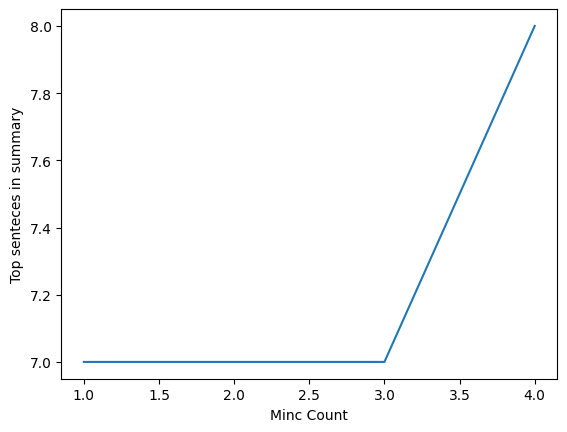

In [119]:
sentences = []
for i in range(len(articles_sent_tokenized)):
  for x in articles_sent_tokenized[i]:
    sentences.append(x.split())

min_count = {}

def train_min_count():

  for x in range(1,5):
    model = Word2Vec(workers=4,vector_size=120,min_count=x,window=4,sg=1,sample=1e-3,negative=10,alpha=0.025,min_alpha=0.0008333)
    model.build_vocab(sentences, progress_per=10000)
    model.train(sentences, total_examples=model.corpus_count, epochs=10, report_delay=1)

    #Check scores for each iteration
    totalFiles = 0
    for testFile in testFiles:
      top_sentences = get_top_sentences(model, testFile)
      #print(top_sentences[-3:])
      ct = inSummary(testFile, top_sentences)
      #print(ct)
      totalFiles+=ct
    print(totalFiles)
    min_count[x] = totalFiles

train_min_count()

#Plot windows size and Sentences found in summaries
import matplotlib.pylab as plt

lists = sorted(min_count.items()) # sorted by key, return a list of tuples

x, y = zip(*lists) # unpack a list of pairs into two tuples

plt.plot(x, y)
plt.xlabel("Minc Count")
plt.ylabel("Top senteces in summary")
plt.show()

## Grid search for window size

7
7
6
7
7
7


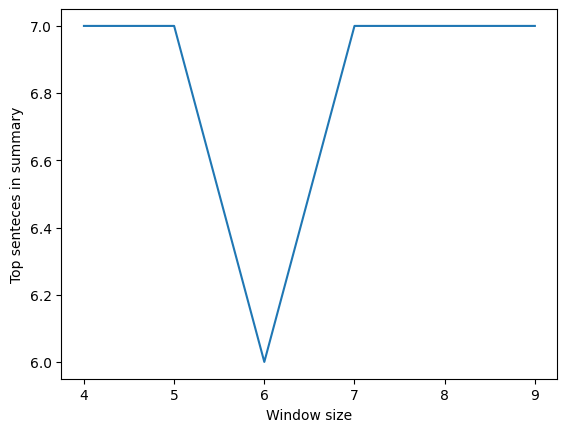

In [120]:
sentences = []
for i in range(len(articles_sent_tokenized)):
  for x in articles_sent_tokenized[i]:
    sentences.append(x.split())


# Window size tuning

window_tune = {}

def train_model():

  for x in range(4,10):
    model = Word2Vec(workers=4,vector_size=120,min_count=4,window=x,sg=1,sample=1e-3,negative=10,alpha=0.025,min_alpha=0.0008333)
    model.build_vocab(sentences, progress_per=10000)
    model.train(sentences, total_examples=model.corpus_count, epochs=10, report_delay=1)

    #Check scores for each iteration
    totalFiles = 0
    for testFile in testFiles:
      top_sentences = get_top_sentences(model, testFile)
      #print(top_sentences[-3:])
      ct = inSummary(testFile, top_sentences)
      #print(ct)
      totalFiles+=ct
    print(totalFiles)
    window_tune[x] = totalFiles

train_model()

#Plot windows size and Sentences found in summaries
import matplotlib.pylab as plt

lists = sorted(window_tune.items()) # sorted by key, return a list of tuples

x, y = zip(*lists) # unpack a list of pairs into two tuples

plt.plot(x, y)
plt.xlabel("Window size")
plt.ylabel("Top senteces in summary")
plt.show()

## Grid search for Alpha

7
7
8
6
7


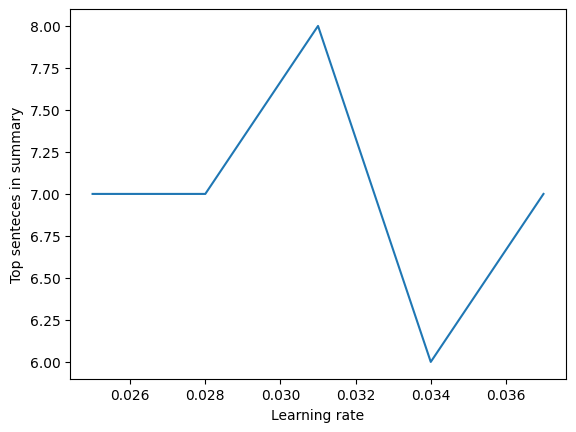

In [121]:
#Tune learning rate
sentences = []
for i in range(len(articles_sent_tokenized)):
  for x in articles_sent_tokenized[i]:
    sentences.append(x.split())

alpha_tune = {}

def train_alpha():

  a = 0.025
  while a < 0.04:
    model = Word2Vec(workers=4,vector_size=100,min_count=1,window=7,sg=1,sample=1e-3,negative=10,alpha=a,min_alpha=0.0008333)
    model.build_vocab(sentences, progress_per=10000)
    model.train(sentences, total_examples=model.corpus_count, epochs=10, report_delay=1)

    #Check scores for each iteration
    totalFiles = 0
    for testFile in testFiles:
      top_sentences = get_top_sentences(model, testFile)
      #print(top_sentences[-3:])
      ct = inSummary(testFile, top_sentences)
      #print(ct)
      totalFiles+=ct
    print(totalFiles)
    alpha_tune[a] = totalFiles
    a+=0.003

train_alpha()

#Plot learning rate curve
lists = sorted(alpha_tune.items()) # sorted by key, return a list of tuples
x, y = zip(*lists) # unpack a list of pairs into two tuples
plt.plot(x, y)
plt.xlabel("Learning rate")
plt.ylabel("Top senteces in summary")
plt.show()

## Grid search for Vector size

7
9
9
7
8
8


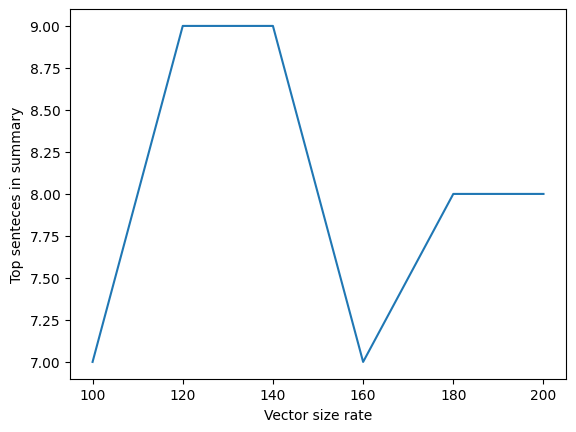

In [122]:
sentences = []
for i in range(len(articles_sent_tokenized)):
  for x in articles_sent_tokenized[i]:
    sentences.append(x.split())
# Tune vector size

vector_size_tune = {}

def train_model3():

  for x in range(100,220, 20):
    model = Word2Vec(workers=4,vector_size=x,min_count=1,window=7,sg=1,sample=1e-3,negative=10,alpha=0.034,min_alpha=0.0008333)
    model.build_vocab(sentences, progress_per=10000)
    model.train(sentences, total_examples=model.corpus_count, epochs=10, report_delay=1)

    #Check scores for each iteration
    totalFiles = 0
    for testFile in testFiles:
      top_sentences = get_top_sentences(model, testFile)
      #print(top_sentences[-3:])
      ct = inSummary(testFile, top_sentences)
      #print(ct)
      totalFiles+=ct
    print(totalFiles)
    vector_size_tune[x] = totalFiles

train_model3()
lists = sorted(vector_size_tune.items()) # sorted by key, return a list of tuples
x, y = zip(*lists) # unpack a list of pairs into two tuples
plt.plot(x, y)
plt.xlabel("Vector size rate")
plt.ylabel("Top senteces in summary")
plt.show()

## Grid search for Negative Sampling

7
8
8
7
9


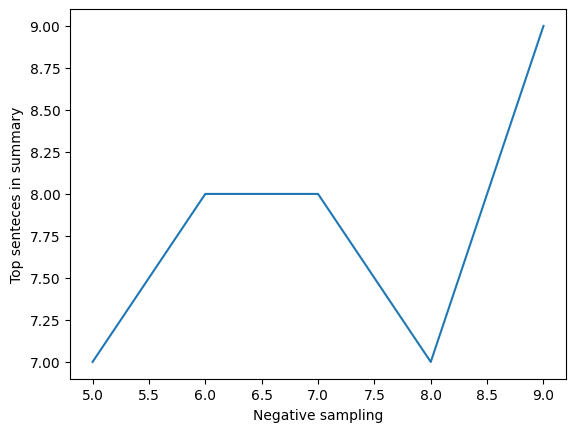

In [123]:
negative_tune = {}

def train_model4():

  for x in range(5,10):
    model = Word2Vec(workers=4,vector_size=140,min_count=1,window=7,sg=1,sample=1e-3,negative=x,alpha=0.034,min_alpha=0.0008333)
    model.build_vocab(sentences, progress_per=10000)
    model.train(sentences, total_examples=model.corpus_count, epochs=10, report_delay=1)

    #Check scores for each iteration
    totalFiles = 0
    for testFile in testFiles:
      top_sentences = get_top_sentences(model, testFile)
      #print(top_sentences[-3:])
      ct = inSummary(testFile, top_sentences)
      #print(ct)
      totalFiles+=ct
    print(totalFiles)
    negative_tune[x] = totalFiles

train_model4()
lists = sorted(negative_tune.items()) # sorted by key, return a list of tuples
x, y = zip(*lists) # unpack a list of pairs into two tuples
plt.xlabel("Negative sampling")
plt.ylabel("Top senteces in summary")
plt.plot(x, y)
plt.show()

## Grid search for SG

8
9


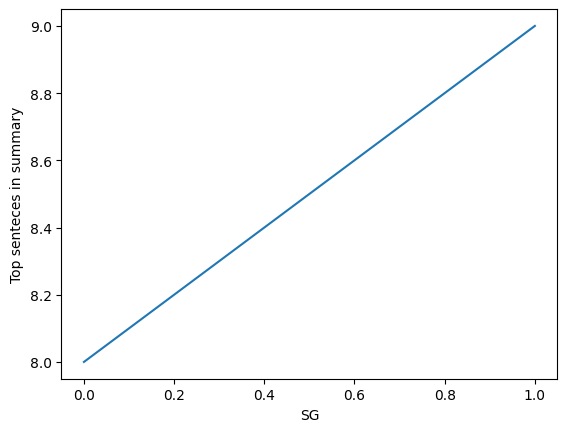

In [125]:
sentences = []
for i in range(len(articles_sent_tokenized)):
  for x in articles_sent_tokenized[i]:
    sentences.append(x.split())

sg = {}

def train_sg():

  for x in range(0,2):
    model = Word2Vec(workers=4,vector_size=140,min_count=1,window=7,sg=x,sample=1e-3,negative=9,alpha=0.034,min_alpha=0.0008333)
    model.build_vocab(sentences, progress_per=10000)
    model.train(sentences, total_examples=model.corpus_count, epochs=10, report_delay=1)

    #Check scores for each iteration
    totalFiles = 0
    for testFile in testFiles:
      top_sentences = get_top_sentences(model, testFile)
      #print(top_sentences[-3:])
      ct = inSummary(testFile, top_sentences)
      #print(ct)
      totalFiles+=ct
    print(totalFiles)
    sg[x] = totalFiles

train_sg()

#Plot windows size and Sentences found in summaries
import matplotlib.pylab as plt

lists = sorted(sg.items()) # sorted by key, return a list of tuples

x, y = zip(*lists) # unpack a list of pairs into two tuples

plt.plot(x, y)
plt.xlabel("SG")
plt.ylabel("Top senteces in summary")
plt.show()

## Grid search for min_alpha

8
8
8
7
8
8
8
8
8
9


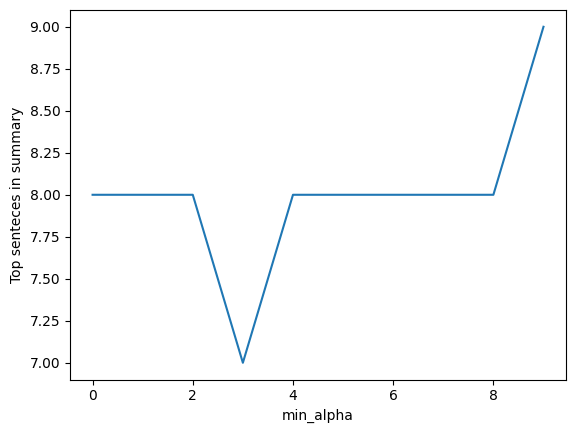

In [126]:
sentences = []
for i in range(len(articles_sent_tokenized)):
  for x in articles_sent_tokenized[i]:
    sentences.append(x.split())

min_alpha_dict = {}

def train_min_alpha():

  for i in range(0,10):
    n = 0.01
    model = Word2Vec(workers=4,vector_size=140,min_count=1,window=7,sg=0,sample=1e-3,negative=9,alpha=0.034,min_alpha=n)
    model.build_vocab(sentences, progress_per=10000)
    model.train(sentences, total_examples=model.corpus_count, epochs=10, report_delay=1)

    #Check scores for each iteration
    totalFiles = 0
    for testFile in testFiles:
      top_sentences = get_top_sentences(model, testFile)
      #print(top_sentences[-3:])
      ct = inSummary(testFile, top_sentences)
      #print(ct)
      totalFiles+=ct
    print(totalFiles)
    min_alpha_dict[i] = totalFiles
    n -= 0.001

train_min_alpha()

#Plot windows size and Sentences found in summaries
import matplotlib.pylab as plt

lists = sorted(min_alpha_dict.items()) # sorted by key, return a list of tuples

x, y = zip(*lists) # unpack a list of pairs into two tuples

plt.plot(x, y)
plt.xlabel("min_alpha")
plt.ylabel("Top senteces in summary")
plt.show()

## Grid search for workers

9
8
7
8
8
8


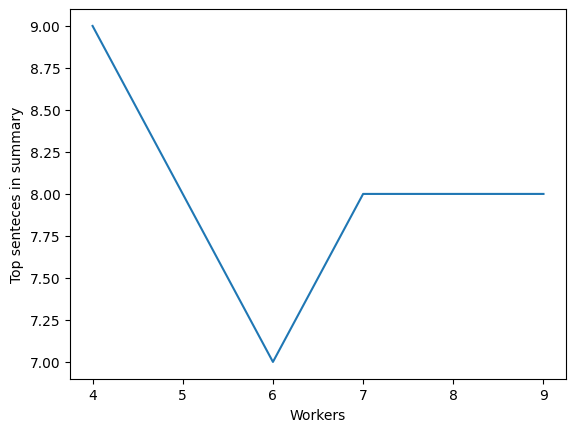

In [127]:
sentences = []
for i in range(len(articles_sent_tokenized)):
  for x in articles_sent_tokenized[i]:
    sentences.append(x.split())

workers_dict = {}

def train_workers():

  for x in range(4,10):
    model = Word2Vec(workers=x,vector_size=140,min_count=1,window=7,sg=0,sample=1e-3,negative=9,alpha=0.034,min_alpha=0.01)
    model.build_vocab(sentences, progress_per=10000)
    model.train(sentences, total_examples=model.corpus_count, epochs=10, report_delay=1)

    #Check scores for each iteration
    totalFiles = 0
    for testFile in testFiles:
      top_sentences = get_top_sentences(model, testFile)
      #print(top_sentences[-3:])
      ct = inSummary(testFile, top_sentences)
      #print(ct)
      totalFiles+=ct
    print(totalFiles)
    workers_dict[x] = totalFiles

train_workers()

#Plot windows size and Sentences found in summaries
import matplotlib.pylab as plt

lists = sorted(workers_dict.items()) # sorted by key, return a list of tuples

x, y = zip(*lists) # unpack a list of pairs into two tuples

plt.plot(x, y)
plt.xlabel("Workers")
plt.ylabel("Top senteces in summary")
plt.show()

### Step 6. Summarize your experiemental results from steps 1-4 and explain your findings by referring to published papers whenever possible.

#TODO explain your findings by referring to published papers whenever possible.

In [128]:
hyperparamTitles = ['min_count','window','vector_size','sample','alpha','min_alpha','sg','workers']
hyperparamValues = [4,7,140,9,0.034,0.01,0,4]
hyperparamDf = pd.DataFrame(list(zip(hyperparamTitles, hyperparamValues)), columns =['Hyperparameter', 'Optimal Value'])

In [129]:
hyperparamDf

,Hyperparameter,Optimal Value
0,min_count,4.000
1,window,7.000
2,vector_size,140.000
3,sample,9.000
4,alpha,0.034
5,min_alpha,0.010
6,sg,0.000
7,workers,4.000


# [FINAL] PLEASE USE THIS MODEL TO VALIDATE PERFORMANCE!

## Training model with optimal hyperparameters and testing performance

In [130]:
sentences = []
for i in range(len(articles_sent_tokenized)):
  for x in articles_sent_tokenized[i]:
    sentences.append(x.split())

final_model = Word2Vec(workers=4,vector_size=140,min_count=1,window=7,sg=0,sample=1e-3,negative=9,alpha=0.034,min_alpha=0.01)
final_model.build_vocab(sentences, progress_per=10000)
final_model.train(sentences, total_examples=model.corpus_count, epochs=10, report_delay=1)


(1483486, 1871870)

In [131]:
#main func to test 5 random files

import random

totalSentencesInSummary = 0

#Get five random files
testFiles = filenames[42:47]

for testFile in testFiles:

  #get top sentences similar to title
  top_sentences = get_top_sentences(final_model, testFile)
  print(top_sentences[-3:])

  #Check how many of them are in affiliated summary
  ct = inSummary(testFile, top_sentences)
  print(ct)
  totalSentencesInSummary+=ct

print("Total sentences found in affiliated summaries is " + str(totalSentencesInSummary) + " out of a possible 15")

[(0.8182812, 'Among the over-65s, 70% said they would be certain to vote in an immediate election, compared with 39% of people under 55.'), (0.83188885, 'Political parties cannot afford to take older UK voters for granted in the coming election, says Age Concern.'), (0.8590471, 'He also called for measures to combat ageism and build effective public services to "support us all in an ageing society".')]
2
[(0.77253544, 'Duchy officials, who will appear before the committee on Monday, are only responsible for generating money.'), (0.7833266, 'However, the Prince of Wales did receive over £4m from government departments and grants-in-aid in 2003-4.'), (0.9039549, 'It was set up in 1337 by King Edward III to provide income for successive heirs to the throne.')]
1
[(0.7475779, 'The Edinburgh MSP earns up to £30,000 a year from the law firm Tods Murray, where he is a partner.'), (0.7626822, 'Mr McLetchie then sought guidance from the standards committee to clarify his position.'), (0.8778075

## Repeat the summarization task above with TFHub Universal Sentence Encoder

In [137]:
import pandas as pd
import nltk
from nltk.chunk.regexp import RegexpParser
from nltk.chunk import tree2conlltags
from nltk import word_tokenize, sent_tokenize
import tensorflow_hub as hub

In [138]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\PC\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [139]:
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [140]:
from scipy.spatial import distance

### TFHUB experiments :

In [141]:
# Sample article text
# article_text = "".join(corpus[0])

# Tokenize the article into sentences
sentences = articles_sent_tokenized[4]

# Embed sentences using the Universal Sentence Encoder
sentence_embeddings = embed(sentences)

# Reference sentence for summarization (can be a topic sentence or key idea)
reference_sentence = corpus[0][0]
reference_embedding = embed([reference_sentence])

# Find the sentences most similar to the reference sentence
similarities = [1 - distance.cosine(reference_embedding[0], sentence_embedding) for sentence_embedding in sentence_embeddings]
top_sentences_indices = sorted(range(len(similarities)), key=lambda i: similarities[i], reverse=True)[:3]  # Get top 3 indices

# Extracting the top sentences for summarization
summary_sentences = [sentences[i] for i in top_sentences_indices]
summary = " ".join(summary_sentences)


In [142]:
summary

'"I think that Gordon Brown wants to be part of the successful Labour government which delivers in the third term for the priorities of the people and sees off a Conservative Party that will take Britain backwards," Mr Balls told Today. "If the MPC (the Bank of England\'s Monetary Policy Committee) were to judge that a rate rise was justified before the election because of the strength of the economy - and I\'m not predicting that they will - I do not believe that this will be a big election issue in Britain for Labour," he told a Parliamentary lunch. He also stressed rise in interest rates ahead of an expected May election would not affect the Labour Party\'s chances of winning.'

Original Text for Reference

In [143]:
"".join(corpus[4])

'Brown ally rejects Budget spreeChancellor Gordon Brown\'s closest ally has denied suggestions there will be a Budget giveaway on 16 March.Ed Balls, ex-chief economic adviser to the Treasury, said there would be no spending spree before polling day. But Mr Balls, a prospective Labour MP, said he was confident the chancellor would meet his fiscal rules. He was speaking as Sir Digby Jones, CBI director general, warned Mr Brown not to be tempted to use any extra cash on pre-election bribes.Mr Balls, who stepped down from his Treasury post to stand as a Labour candidate in the election, had suggested that Mr Brown would meet his golden economic rule - "with a margin to spare". He said he hoped more would be done to build on current tax credit rules.He also stressed rise in interest rates ahead of an expected May election would not affect the Labour Party\'s chances of winning. Expectations of a rate rise have gathered pace after figures showed house prices are still rising. Consumer borrow

In [144]:
def get_top_sentences_TFHub(model, filename):
    sentences_score = []
    idx = filenames.index(filename)
    s1 = titles[idx][0]

    # Embed title using the Universal Sentence Encoder
    reference_embedding = embed([s1.lower()])

    for s1 in articles_sent_tokenized[idx]:
        # Embed sentence using the Universal Sentence Encoder
        sentence_embedding = embed([s1.lower()])

        # Calculate cosine similarity between reference embedding and sentence embedding
        similarity = np.inner(reference_embedding, sentence_embedding)

        sentences_score.append((similarity[0][0], s1))

    # Sort sentences based on similarity
    top_sentences = sorted(sentences_score, reverse=True)

    return top_sentences

In [145]:
totalSentencesInSummary = 0

#Get five random files
testFiles = filenames[40:45]

for testFile in testFiles:

  #get top sentences similar to title
  top_sentences = get_top_sentences_TFHub(final_model, testFile)
  print(top_sentences[-3:])

  #Check how many of them are in affiliated summary
  ct = inSummary(testFile, top_sentences)
  print(ct)
  totalSentencesInSummary+=ct

print("Total sentences found in affiliated summaries is " + str(totalSentencesInSummary) + " out of a possible 15")

[(-0.0085912645, 'He was prepared to stand up to the teaching unions - which sometimes heckled his speeches - and his policy of charging university students for tuition fees was not popular.'), (-0.03218904, 'Mr Blunkett entered Parliament for Sheffield Brightside in 1987, after first contesting the Sheffield Hallam seat in 1974.'), (-0.07625932, 'His responsibilities in running the Home Office included civil emergencies, security, terrorism and expenditure.')]
1
[(0.09013661, 'It will lead to conflict between Unison and the government, if not this year then next."'), (-0.0071950527, '"This is a position that Unison cannot accept and will oppose.'), (-0.09346364, 'He said: "What\'s important is that there\'s a process going on, it\'s out for consultation at the moment, let\'s wait for that process to complete itself."')]
0
[(0.11636366, 'A total of 3,028 adults aged 18 or over were interviewed for the study.'), (0.11038852, 'He also called for measures to combat ageism and build effect

<a name='textrank'></a>
# Comparison with pre-trained models
### Use a pre-trained model other than TFHub to extract the most importatn sentence from each article of your given domain
### Show your pre-trained model results in the form of a classification report
### Compare and illustrate the pretrained model with that of your feature vectors and TFHub approach similar to the following(replace TextRank label with that yours):


### Summarize your comparison results with a table similar to the following
| Algorithm            | Most relevant sentences show up in how many summaries| avg % of relevant sentences appearing in summaries |
| ----------- | -----------       | ----------- |
| Feature vectors| 212/510 |  0.28|
| WordVec    | 118/520       | 0.37 |
| TFHub  | 229/520        | 0.59 |
| Your Pre-trained model   | ...       | ... |

### Comment on your finding with reasons

# The following are optional bonus parts:
### Must <font color=red>indicate clearly who collaborate for each optional part</font> (if any)

#T5 TRYOUT : Tried out a pre trained model other than TF IDF

#TODO Have to run validation and get metrics to compare it with all the others


In [146]:
!pip install torch transformers

'pip' is not recognized as an internal or external command,
operable program or batch file.


In [148]:
import torch
from transformers import AutoTokenizer, AutoModelWithLMHead

In [149]:
tokenizer=AutoTokenizer.from_pretrained('T5-base')
model=AutoModelWithLMHead.from_pretrained('T5-base', return_dict=True)

config.json:   0%|          | 0.00/1.21k [00:00<?, ?B/s]

c:\Users\PC\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:147: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\PC\.cache\huggingface\hub. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to see activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.39M [00:00<?, ?B/s]

c:\Users\PC\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\models\auto\modeling_auto.py:1564: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
  warnings.warn(


model.safetensors:   0%|          | 0.00/892M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/147 [00:00<?, ?B/s]

In [150]:
corpus_without_titles = [inner_list[1:] for inner_list in corpus]

In [151]:
sequence = ("Data science is an interdisciplinary field[10] focused on extracting knowledge from typically large data sets and applying the knowledge and insights from that data to solve problems in a wide range of application domains.[11] The field encompasses preparing data for analysis, formulating data science problems, analyzing data, developing data-driven solutions, and presenting findings to inform high-level decisions in a broad range of application domains. As such, it incorporates skills from computer science, statistics, information science, mathematics, data visualization, information visualization, data sonification, data integration, graphic design, complex systems, communication and business.[12][13] Statistician Nathan Yau, drawing on Ben Fry, also links data science to human–computer interaction: users should be able to intuitively control and explore data.[14][15] In 2015, the American Statistical Association identified database management, statistics and machine learning, and distributed and parallel systems as the three emerging foundational professional communities.[16]")

In [152]:
inputs=tokenizer.encode("sumarize: " +sequence,return_tensors='pt', max_length=512, truncation=True)

In [153]:
output = model.generate(inputs, min_length=80, max_length=100)

In [154]:
summary=tokenizer.decode(output[0])
print(summary)

<pad> data science is an interdisciplinary field focused on extracting knowledge from typically large data sets. it incorporates skills from computer science, statistics, information science, mathematics, data visualization, information visualization, data sonification, graphic design, complex systems, communication and business. the field encompasses preparing data for analysis, formulating data science problems, analyzing data, developing data-driven solutions.</s>


In [155]:
sequence = ("Data science is an interdisciplinary field[10] focused on extracting knowledge from typically large data sets and applying the knowledge and insights from that data to solve problems in a wide range of application domains.[11] The field encompasses preparing data for analysis, formulating data science problems, analyzing data, developing data-driven solutions, and presenting findings to inform high-level decisions in a broad range of application domains. As such, it incorporates skills from computer science, statistics, information science, mathematics, data visualization, information visualization, data sonification, data integration, graphic design, complex systems, communication and business.[12][13] Statistician Nathan Yau, drawing on Ben Fry, also links data science to human–computer interaction: users should be able to intuitively control and explore data.[14][15] In 2015, the American Statistical Association identified database management, statistics and machine learning, and distributed and parallel systems as the three emerging foundational professional communities.[16]")
inputs=tokenizer.encode("sumarize: " +sequence,return_tensors='pt', max_length=512, truncation=True)
output = model.generate(inputs, min_length=80, max_length=100)

In [156]:
corpus_without_titles[0]

['Maternity pay for new mothers is to rise by £1,400 as part of new proposals announced by the Trade and Industry Secretary Patricia Hewitt.',
 'It would mean paid leave would be increased to nine months by 2007, Ms Hewitt told GMTV\'s Sunday programme. Other plans include letting maternity pay be given to fathers and extending rights to parents of older children. The Tories dismissed the maternity pay plan as "desperate", while the Liberal Democrats said it was misdirected.',
 'Ms Hewitt said: "We have already doubled the length of maternity pay, it was 13 weeks when we were elected, we have already taken it up to 26 weeks. "We are going to extend the pay to nine months by 2007 and the aim is to get it right up to the full 12 months by the end of the next Parliament." She said new mothers were already entitled to 12 months leave, but that many women could not take it as only six of those months were paid. "We have made a firm commitment. We will definitely extend the maternity pay, fr

In [157]:
for text in corpus_without_titles[50:60]:
    index = 0
    article_text = ""
    for sentences in text:
      article_text = article_text + sentences
    index = index + 1
    # Generate the summary using T5 for each article
    inputs = tokenizer.encode("summarize: " + article_text, return_tensors='pt', max_length=512, truncation=True)
    output = model.generate(inputs, min_length=80, max_length=100, num_return_sequences=1)

    # Decode and print the generated summary
    summary = tokenizer.decode(output[0], skip_special_tokens=True)
    print(f"Article {index} Summary: {summary}")


Article 1 Summary: the Constitutional Affairs Select Committee says parents with custody could exploit delays. but they reject the claim made by some campaign groups that there should be a legal presumption of equal access. they say the law should be changed to require family courts to take account of the relationship. the committee chairman says the inquiry has been a "complex and emotive" one.
Article 1 Summary: amitai etzioni says the priority should be on "failing states" he says a nuclear terrorist attack is the main danger faced by many nations. he says there is an urgent need to curb terrorists' access to nuclear weapons. he says the u.s. should be more concerned about preventing nuclear attacks.
Article 1 Summary: former spy claims he has been betrayed by the British authorities. he says he has been denied defector status and a decent pension. he joined the kGB in 1970s as an idealistic 20 year-old. but he became deeply disenchanted with the Soviet regime. he was posted to the 

# Model Comparison: Feature Vector, Word2Vec, TFHub and T5

### Feature Vector: ToDo: Rework to get top 3 sentences

In [158]:
# Sample usage
def summarizeFVec(n, entire_text, title, doc):
    # Define feature weights
    weights = {
        'F1': 0.2,  # Title feature
        'F2': 0.1,  # Sentence length
        'F3': 0.3,  # Sentence position
        'F5': 0.2,  # Term weight
        'F6': 0.1,  # Proper noun
        'F7': 0.1   # Numerical data
    }

    longest_sentence = calulateLongestSent(doc)
    total_sentences = len(doc)

    # print("Entire text: %s" % (entire_text))

    # Create a list of tuples (sentence, f_score)
    sentence_f_scores = []

    for pos in range(1, len(doc)):
        sentence = doc[pos]
        f_score = compute_sentence_score(sentence=sentence, entire_text=entire_text, title=title,
                                         weights=weights, longest_sentence=longest_sentence, position=pos,
                                         total_sentences=total_sentences)

        sentence_f_scores.append((f_score,sentence))

    # Sort sentences by F score in ascending order
    sorted_sentences = sorted(sentence_f_scores, key=lambda x: x[1])

    return sorted_sentences

In [159]:
summarizeFVec(0, entire_text=X[1], title = corpus[1][0], doc = corpus[1])

[(0.515217223512596,
  '"If in doubt retain, that has been the long-standing principle of the civil service and public authorities. It\'s only when you\'ve got no further use for the particular record that it may be legitimate to destroy it. "But any deliberate destruction to avoid the possibility of later disclosure is to be totally condemned." The Freedom of Information Act will cover England, Wales and Northern Ireland from next year. Similar measures are being brought in at the same time in Scotland. It provides the public with a right of access to information held by about 100,000 public bodies, subject to various exemptions. Its implementation will be monitored by the information commissioner.'),
 (0.3038317733803454,
  'Mr Thomas said: "The new Act of Parliament makes it very clear that to destroy records in order to prevent their disclosure becomes a criminal offence." He said there was already clear guidance on the retention of e-mails contained in a code of practice from the 

In [165]:
import pickle
with open('feature_vector.pkl', 'wb') as function_file:
    pickle.dump(compute_sentence_score, function_file)

In [163]:
totalSentencesInSummary = 0

testFiles = filenames
n = 0

for testFile in testFiles:

  #get top sentences similar to title
  top_sentences = summarizeFVec(n-1, entire_text=X[n-1], title = corpus[n-1][0], doc = corpus[n-1])
  # print(top_sentences[-3:])

  #Check how many of them are in affiliated summary
  ct = inSummary(testFile, top_sentences)
  # print(ct)
  totalSentencesInSummary+=ct

  n = n + 1

FVecResults = totalSentencesInSummary
FVecAverage = totalSentencesInSummary / len(testFiles)

print("Total sentences found in affiliated summaries is " + str(FVecResults) + " out of a possible " + str(len(testFiles)*3))
print("Average sentences found in affiliated summaries is", FVecAverage)

KeyError: 'Summaries\\Summaries\\politics\\001.txt'

## Word2Vec

In [162]:
totalSentencesInSummary = 0

testFiles = filenames

for testFile in testFiles:

  #get top sentences similar to title
  top_sentences = get_top_sentences(final_model, testFile)
  # print(top_sentences[-3:])

  #Check how many of them are in affiliated summary
  ct = inSummary(testFile, top_sentences)
  # print(ct)
  totalSentencesInSummary+=ct

Word2VecResults = totalSentencesInSummary
Word2VecAverage = totalSentencesInSummary / len(testFiles)

print("Total sentences found in affiliated summaries is " + str(Word2VecResults) + " out of a possible " + str(len(testFiles)*3))
print("Average sentences found in affiliated summaries is", Word2VecAverage)

IndexError: list index out of range

In [166]:
with open('word2vec_model.pkl', 'wb') as model_file:
    pickle.dump(final_model, model_file)


## TFHub

In [172]:
totalSentencesInSummary = 0

testFiles = filenames

for testFile in testFiles:

  #get top sentences similar to title
  top_sentences = get_top_sentences_TFHub(final_model, testFile)
  # print(top_sentences[-3:])

  #Check how many of them are in affiliated summary
  ct = inSummary(testFile, top_sentences)
  # print(ct)
  totalSentencesInSummary+=ct

TFHubResults = totalSentencesInSummary
TFHubAverage = totalSentencesInSummary / len(testFiles)

print("Total sentences found in affiliated summaries is " + str(TFHubResults) + " out of a possible " + str(len(testFiles)*3))
print("Average sentences found in affiliated summaries is", TFHubAverage)

IndexError: list index out of range

In [173]:
with open('tfhub_model.pkl', 'wb') as function_file:
    pickle.dump(get_top_sentences_TFHub, function_file)


## T5

In [174]:
def getTop3T5Sentences(textfile):
  for text in textfile:
    article_text = ""
    for sentences in text:
      article_text = article_text + sentences
    # Generate the summary using T5 for each article
    inputs = tokenizer.encode("summarize: " + article_text, return_tensors='pt', max_length=512, truncation=True)
    output = model.generate(inputs, min_length=80, max_length=100, num_return_sequences=1)

    # Assuming output is a tensor with the generated summary
    decoded_output = tokenizer.decode(output[0], skip_special_tokens=True)

    # Split the summary into sentences
    sentences = decoded_output.split('.')

    return sentences



In [175]:
def inSummaryT5(filename, top_sentences):
  summary = reference_summaries[filename]
  count = 0
  top3_sentences = top_sentences[-3:]
  for x in top3_sentences:
    sentence = x
    if sentence in summary:
      count+=1
  return count

In [176]:
with open('T5_model.pkl', 'wb') as function_file:
    pickle.dump(getTop3T5Sentences, function_file)


WARNING: TAKES 25 MINUTES TO RUN!

In [ ]:
totalSentencesInSummary = 0

testFiles = filenames
for testFile in testFiles:

  #get top sentences similar to title
  top_sentences = getTop3T5Sentences(testFile)
  # print(top_sentences[-3:])

  #Check how many of them are in affiliated summary
  ct = inSummaryT5(testFile, top_sentences)
  # print(ct)
  totalSentencesInSummary+=ct

T5Results = totalSentencesInSummary
T5Average = totalSentencesInSummary / len(testFiles)

print("Total sentences found in affiliated summaries is " + str(T5Results) + " out of a possible " + str(len(testFiles)*3))
print("Average sentences found in affiliated summaries is", T5Average)

Total sentences found in affiliated summaries is 420 out of a possible 1251
Average sentences found in affiliated summaries is 1.0071942446043165


In [ ]:
algos = ['Feature Vector','Word2Vec','TFHub','T5']
results = [FVecResults,Word2VecResults,TFHubResults,T5Results]
averages = [FVecAverage,Word2VecAverage,TFHubAverage,T5Average]

finalresultsdf = pd.DataFrame({
    'Algorithm': algos,
    'Sentences In Summaries': results,
    'Average number of sentences in summaries (%)': averages
})

# Divide averages by 3, multiply by 100, and round to 2 decimals
finalresultsdf['Average number of sentences in summaries (%)'] = (finalresultsdf['Average number of sentences in summaries (%)'] / 3) * 100
finalresultsdf['Average number of sentences in summaries (%)'] = finalresultsdf['Average number of sentences in summaries (%)'].round(2)


In [ ]:
finalresultsdf

,Algorithm,Sentences In Summaries,Average number of sentences in summaries (%)
0,Feature Vector,211,16.87
1,Word2Vec,525,41.97
2,TFHub,243,19.42
3,T5,420,33.57


Note: Total possible sentences in above data frane is 1251.

<a name='web'></a>
# Interactive web application of your trained models (+50/100)
### - Render how your trained models will respond on the web using [streamlit](https://streamlit.io/) or similar
### - Allow user to select one of the 4 approaches (feature-vectors, WordVec, TFHub, and your selected pre-trained model to see the results
### - Allow user to select an ariticle (a number between 1 to the last number on the last article, e.g. 520)
### - Show the top 3 sentences returned and the relevant summary
### - Indicate which of the 3 top sentences show up in the summary(e..g, highlighting or coloring the matching senetences)

### - provide an URL to your deployed application

### - Provide your code and a <font color=red>clear README</font> on how to set up and deploy your applicaiton on the web. Upload these file to the assignment

### Only s fully functioning web application with all of the above will be considered for bonus points.


<a name='additional'></a>
# Additional Interactive web application (+25/100)
## Repeat B1 with
### - a different web rendering platform and
### -a different presentation style to query and present the results



<a name='additional_results'></a>
#Additional related results not shown above
